In [1]:
import torch
from diffusers import AutoencoderKL, UNet2DConditionModel, DPMSolverMultistepScheduler, StableDiffusionPipeline, DDIMScheduler
from transformers import CLIPTokenizer, CLIPTextModel
import gc

import os

# model_id = "stabilityai/stable-diffusion-2-1"
model_id = "stabilityai/stable-diffusion-2-base"
torch_device = "cuda"

pipe = StableDiffusionPipeline.from_pretrained(model_id)
pipe = pipe.to(torch_device)
pipe.set_progress_bar_config(disable=True)

c:\Users\merat\AppData\Local\miniconda3\envs\dbooth\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 17.46it/s]


In [ ]:
# pipe.set_progress_bar_config(disable=False)
# cur_idx = 730
# with torch.no_grad():
#     imges = pipe(["a photo of young woman"]*1).images
# # for img in imges:
# #     img.save(f"./class_dog/v2-1_648/dog_{cur_idx}.jpeg")
# #     cur_idx += 1

100%|██████████| 50/50 [00:11<00:00,  4.49it/s]


In [16]:
from tqdm.auto import tqdm
cur_idx = 216
batch_size = 4
class_obj = "woman"
for i in tqdm(range((800-cur_idx)//batch_size)):
    with torch.no_grad():
        imges = pipe([f"a photo of a {class_obj}"]*batch_size).images
    for img in imges:
        img.save(f"./class_{class_obj}/v2-base_512/{class_obj}_{cur_idx}.jpeg")
        cur_idx += 1

 30%|███       | 44/146 [34:23<1:19:43, 46.90s/it]


KeyboardInterrupt: 

In [5]:
from PIL import Image, ImageOps
from torchvision import transforms
from rembg import remove
import os

for name in os.listdir("./db/dorsa_db/"):
    image = Image.open(f"./db/dorsa_db/{name}")
    image = ImageOps.exif_transpose(image)
    output = remove(image, bgcolor=(0,0,0))
    output = output.convert("RGB")
    output.save(f"./db/dorsa_rembg_db/{name}")

In [ ]:

# input_path = 'input.png'
# output_path = 'output.png'

# input = Image.open(input_path)
# output = remove(input)
# output.save(output_path)

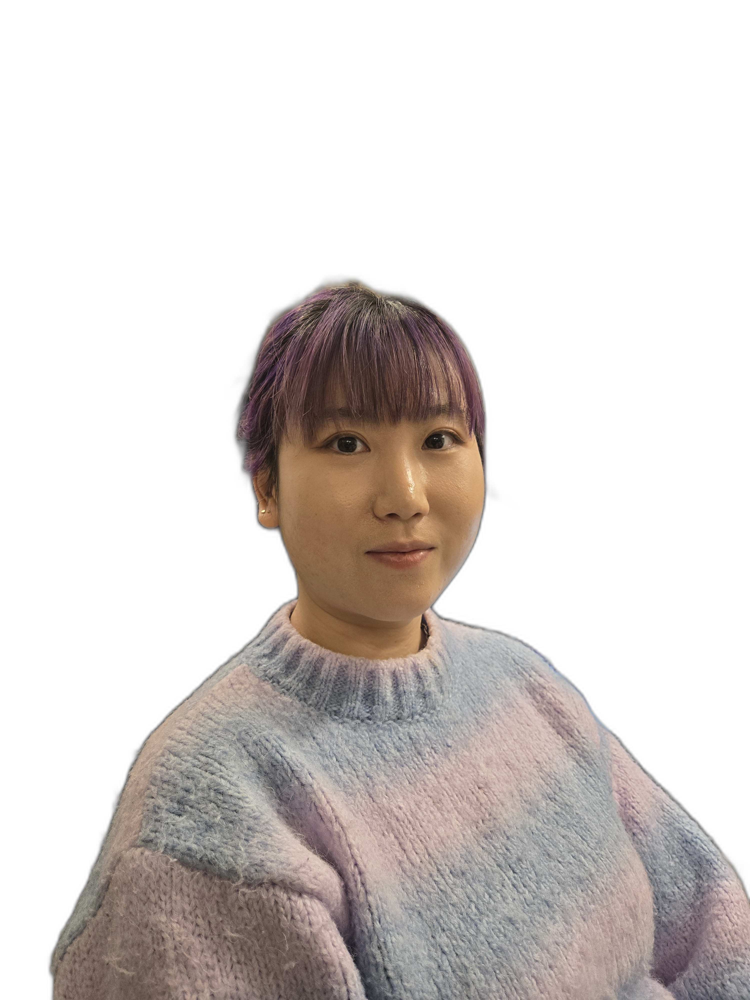

In [4]:
# transform(image)
output